# Image Inpainting - Autoencoders + Traditional CV - Shahan Nedadahandeh - snedadah@uwaterloo.ca

## Abstract

In this project, we attempt to create an image inpainting workflow that takes in an image with a cutout through the center, and tries to infill this area in the most realistic way possible by generating an infilling and integrating it to the image. We do so by combining an autoencoder based approach to generate the infilling, along with a more traditional CV approach to integrate the infilling into the image smoothly. We start by training an autoencoder inspired by the paper Context Encoders by Deepak Pathek et al. We notice similar problems that the authors of the papers noticed, with the L2 loss function leading to blurry inpainting results. 

However, instead of taking the approach outlined in their paper of using an adversarial network to provide an adversarial loss, we investigate alternate approaches to get rid of the blurring, such as using different loss functions that pay more attention to the structure of the image, such as SSIM, creating a custom loss based on image gradients to detect edge. Finally, we propose a workflow that uses Unsharp Masking and mean+median filtering to integrate the generated infilling into the image smoothly. Furthermore, we investigate the latent space of our encoder using principle component analysis, and find out that it meaningfully differs from the latent space of the ResNet encoder. 






### Code Libraries
PyTorch - Used for autoencoder training

TorchVision - Used for image transformations and data loading

MatPlotLib - Used for visualizations

Pytorch_SSIM - Used for implementing the SSIM loss function as part of one of our experiments.

SkLearn - For principal component analysis 

tqdm - Used for displaying progress bars when training


In [264]:
import torch
import torchvision.transforms as T
import torchvision
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torchvision.models as models
import torch.nn.functional as F
import torch.nn as nn
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
import os
import sys
from PIL import Image
import numpy as np
from IPython.display import clear_output
from tqdm import tqdm
from pytorch_ssim import pytorch_ssim
from torch.nn.modules.utils import _pair, _quadruple

### Dataset Download

In [11]:
## The dataset we use is the imagenet dataset
# You can download the dataset using the command: kaggle competitions download -c imagenet-object-localization-challenge

# Update the following variable with your dataset location
DATASET_PATH = '/pub2/imagenet/ILSVRC/Data/CLS-LOC/train'

In [12]:
IMAGE_SIZE = 128 # Size of images fed into the model, we make the images smaller so we can train smaller and quicker models, our results should extend with bigger images as well
CENTER_SIZE = 64 # The amount of
BATCH_SIZE = 500



# The imagenet dataset has over a thousdan different classes. To train a model that works well with all clases would take more time and computation resoruces that we had avarible for this project. So we restrict our model to only work with the fruit classes. There are still different enough classes that our model can meaningfully learn to infill different types of object, while at the same time there are few categories, so we need less training time for our model.

SELECTED_CLASSES =  {
            # 858: "Tile Roof", # Tile Roof
						# 937: "Broccoli", 
						# 980: "Volcano",
						987: "Corn",
						949: 'Strawberry',
						948: "Apple",
						954: "Banana",
						953: "Pineapple",
						951: "Lemon",
						950: 'Orange',
						967: 'Pomegranate'
}

# Utils

The following are some utility methods that will be helpful later in our code.

In [63]:
import math
def display_image(img):
        with torch.no_grad():
                img = img.permute((1, 2, 0))
                plt.imshow(img.cpu().numpy())
                plt.show()

def display_images(imgs, images_per_row=2, title=None):
        with torch.no_grad():
                rows = math.ceil(len(imgs) / images_per_row)
                fig = plt.figure(figsize=(images_per_row*2, rows*2))
                if title:
                        fig.suptitle(title, fontsize=10)
                for i, img in enumerate(imgs):
                        plt.subplot(rows, images_per_row, i+1)
                        plt.axis('off')
                        plt.tight_layout()
                        img = img.permute((1, 2, 0))
                        plt.imshow(img.cpu().numpy())
                plt.show()

def get_center_of_image(img, size=64):
        return T.CenterCrop((size, size))(img)

def get_img_without_center(img):
        left = (IMAGE_SIZE - CENTER_SIZE) // 2
        right = (IMAGE_SIZE - CENTER_SIZE) // 2 + CENTER_SIZE
        if(len(img.shape) == 3):
                img[ :, left:right, left:right ] = 0
        elif(len(img.shape) == 4):
                img[:, :, left:right, left:right ] = 0
        else:
                raise RuntimeError("Wrong shape to get_img_without_center!")
                
        return img

class CenterImageRemoval(object):
    def __init__(self, image_size, center_size):
        self.image_size = image_size
        self.center_size = center_size
        
    def __call__(self, img):
        left = (self.image_size - self.center_size) // 2
        right = (self.image_size - self.center_size) // 2 + self.center_size

        if(len(img.shape) == 3):
                assert img.shape[1] == img.shape[2] == self.image_size
                img[ :, left:right, left:right ] = 0
        elif(len(img.shape) == 4):
                assert img.shape[2] == img.shape[3] == self.image_size
                img[:, :, left:right, left:right ] = 0

        return img

class AddImageCenter(object):
    def __init__(self, image_size, center_size):
        self.image_size = image_size
        self.center_size = center_size
        
    def __call__(self, img, center):
        assert center.shape[1] == center.shape[2] == self.center_size

        left = (self.image_size - self.center_size) // 2
        right = (self.image_size - self.center_size) // 2 + self.center_size

        if(len(img.shape) == 3):
                assert img.shape[1] == img.shape[2] == self.image_size
                img[ :, left:right, left:right ] = center
        elif(len(img.shape) == 4):
                assert img.shape[2] == img.shape[3] == self.image_size
                img[:, :, left:right, left:right ] = center
        return img

class JointRandomResizeCrop(object):
    def __init__(self, size: int, minimum_scale, maximum_scale):
        """
        params:
            size (int) : size of the center crop
        """
        self.size = size
        self.min_scale = minimum_scale
        self.max_scale = maximum_scale
        
    def __call__(self, img, target):
        scale = (self.max_scale - self.min_scale)*random.random() + self.min_scale
        _, height, width = img.shape
        new_h, new_w = int(height*scale), int(width*scale)

        target = target.reshape((1, height, width))
        resized_img = T.functional.resize(img,  [new_h, new_w])
        resized_target = T.functional.resize(target, [new_h, new_w])
        crop_size = min(self.size, new_h, new_w)
        top = random.randint(0, new_h - crop_size)
        left = random.randint(0, new_w - crop_size)
        resized_img = T.functional.crop(resized_img, top, left, crop_size, crop_size)
        resized_target = T.functional.crop(resized_target, top, left, crop_size, crop_size)

        resized_img = T.functional.resize(resized_img, size=(self.size, self.size))
        resized_target = T.functional.resize(resized_target, size=(self.size, self.size))
        resized_target = resized_target.reshape((self.size, self.size))

        return (resized_img, resized_target)
    
def save_model(encoder, decoder, epoch, optimizer, path):
	state = {
    'epoch': epoch,
    'encoder': encoder.state_dict(),
    'decoder': decoder.state_dict(),
    'optimizer': optimizer.state_dict(),
	}
	torch.save(state, path)


def load_model(encoder, decoder, optimizer, path):
	state = torch.load(path)
	encoder.load_state_dict(state["encoder"])
	decoder.load_state_dict(state["decoder"])
	optimizer.load_state_dict(state["optimizer"])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dataloading

We split our dataset into 3 splits.

- Training: 90% of the data, used for training the model
- Validation: 10% of the data, used for validation
- Sanity: A single image, used for sanity checking our modelCustomDataSet


We create a custom PyTorch DataSet (`CustomDataSet`) class, that supports the special transformtion we want to apply to images (blackening the middle) but not the ground truth.

In [14]:
train_tranforms = T.Compose([
    T.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
    T.RandomResizedCrop(size=(IMAGE_SIZE, IMAGE_SIZE)),
    T.ToTensor(),
    T.RandomHorizontalFlip(p=0.5),
    T.ConvertImageDtype(torch.float32),
])

val_tranforms = T.Compose([
    T.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
    T.ToTensor(),
    T.ConvertImageDtype(torch.float32),
])

# extra transformation not applied to ground truth images (removing the center of the image)
non_gt_extra_transforms = T.Compose([
    CenterImageRemoval(IMAGE_SIZE, CENTER_SIZE),
])

sanity_transforms = T.Compose([
    T.Resize(size=(IMAGE_SIZE, IMAGE_SIZE)),
    T.CenterCrop(size=(IMAGE_SIZE, IMAGE_SIZE)),
    T.ToTensor(),
    T.ConvertImageDtype(torch.float32),
])

In [15]:
class CustomDataSet(Dataset):
    def __init__(self, root_dir, classes, transform=None, non_gt_extra_transforms=None, training_split=0.8, is_train=True):
        self.root_dir = root_dir
        self.transform = transform
        self.non_gt_extra_transforms = non_gt_extra_transforms

        selected_class_indexes = list(classes.keys())
        dirs = np.array(sorted(os.listdir(root_dir)))[selected_class_indexes]

        self.images = []
        self.cache = {}

        self.is_train = is_train
        for i, dir in enumerate(dirs):
            imgs = sorted(os.listdir(os.path.join(self.root_dir, dir)))
            train_split = int(len(imgs)*training_split)
            if is_train:
                imgs = imgs[0:train_split]
            else:
                imgs = imgs[train_split:]
            for img in imgs:
                self.images.append((os.path.join(self.root_dir, dir, img), selected_class_indexes[i]))
    

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name, class_label = self.images[idx]
        image = None

        if img_name not in self.cache:
            self.cache[img_name] = Image.open(img_name).convert('RGB')
        image = self.cache[img_name]


        if self.transform:
            transformed_image = self.transform(image)
        else:
            transformed_image = None

        gt_image = torch.clone(transformed_image)

        if non_gt_extra_transforms:
            transformed_image = non_gt_extra_transforms(transformed_image)

        return transformed_image, gt_image, class_label


# Due to the way the dataset is strucutred, I can't use the offical validation images provided
# Therefore, I'm splitting the provided training_split from the dataset, 90% for training, and 10% for validation
train_dataset = CustomDataSet(root_dir=DATASET_PATH, 
                                      transform=train_tranforms, 
                                      non_gt_extra_transforms=non_gt_extra_transforms,
                                      classes=SELECTED_CLASSES,
                                      is_train=True,
                                      training_split=0.9
                                      )
validation_dataset = CustomDataSet(root_dir=DATASET_PATH, 
                                      transform=val_tranforms, 
                                      non_gt_extra_transforms=non_gt_extra_transforms,
                                      classes=SELECTED_CLASSES,
                                      is_train=False
                                      )

# Like the training dataset but only has 1 image
sanity_dataset = CustomDataSet(root_dir=DATASET_PATH, 
                                      transform=sanity_transforms, 
                                      non_gt_extra_transforms=non_gt_extra_transforms,
                                      classes=SELECTED_CLASSES,
                                      is_train=True,
                                      training_split=0.9
                                      )
sanity_dataset = torch.utils.data.Subset(sanity_dataset, [1])


In [16]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(validation_dataset, batch_size=BATCH_SIZE, shuffle=True)
sanity_loader = DataLoader(sanity_dataset, batch_size=1, shuffle=True)

 ## Sample batch of training and ground truth images

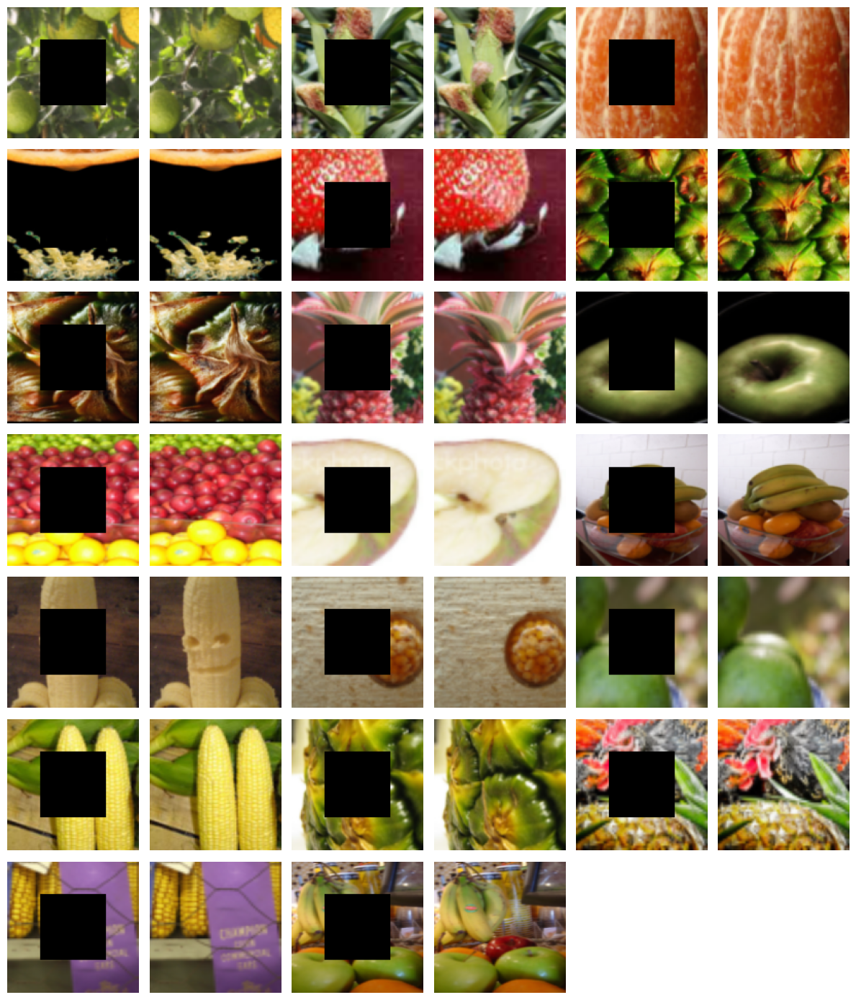

In [19]:
sample_batch = next(iter(train_loader))
sample_cutout, sample_gt, sample_class_idx = sample_batch

def display_sample_batch():
	images = []
	for i in range(20):
		images += [sample_cutout[i], sample_gt[i]]
	display_images(images, images_per_row=6)
display_sample_batch()

# Network

The architecture of our network is inspired by the  the "ContextEncoders" paper. Our model has the following shape (diagram from ContextEncoders)

![Architecture](images/architecture2.png)


Our network has two parts, an Encoder which encodes the context of the image into a 4000 dimensional latent space, and a decoder which decodes points from that latent space into a generated 64x64 infilled area.

In [21]:
LATENT_SPACE_DIM = 4000
HIDDEN_LAYER_SIZE = 64

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
         # (128, 128) -> (64, 64)
        self.conv1 = nn.Conv2d(3, HIDDEN_LAYER_SIZE, kernel_size=4, padding=1, stride=2)  

        # (64, 64) -> (32, 32)
        self.conv2 = nn.Conv2d(HIDDEN_LAYER_SIZE, HIDDEN_LAYER_SIZE, kernel_size=4, padding=1, stride=2)

        # (32, 32) -> (16, 16)
        self.conv3 = nn.Conv2d(HIDDEN_LAYER_SIZE, 2 * HIDDEN_LAYER_SIZE, kernel_size=4, padding=1, stride=2)  # 16x16 => 8x8

        # (16, 16) -> (8, 8)
        self.conv4 = nn.Conv2d(2 * HIDDEN_LAYER_SIZE, 4 * HIDDEN_LAYER_SIZE, kernel_size=4, padding=1, stride=2)

        # (8, 8) -> (4, 4)
        self.conv5 = nn.Conv2d(4 * HIDDEN_LAYER_SIZE, 8*HIDDEN_LAYER_SIZE, kernel_size=4, padding=1, stride=2)  # 8x8 => 4x4
        self.flatten = nn.Flatten()

        # (4, 4) -> (Latent Space Dim)
        self.linear = nn.Linear(4*4 * (8* HIDDEN_LAYER_SIZE), LATENT_SPACE_DIM)

    def forward(self, inp):
        inp = F.leaky_relu(self.conv1(inp))
        inp = F.leaky_relu(self.conv2(inp))
        inp = F.leaky_relu(self.conv3(inp))
        inp = F.leaky_relu(self.conv4(inp))
        inp = F.leaky_relu(self.conv5(inp))
        inp = self.flatten(inp)

        inp = F.leaky_relu(self.linear(inp))
        return inp

In [22]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()

        # (LATENT_SPACE_DIM) -> (4 , 4)
        self.linear = nn.Linear(LATENT_SPACE_DIM, 4*4*8*HIDDEN_LAYER_SIZE)

        # (4, 4) -> (8 , 8)
        self.conv_t1 = nn.ConvTranspose2d(8*HIDDEN_LAYER_SIZE, 4*HIDDEN_LAYER_SIZE, kernel_size=(3, 3), stride=(2, 2), padding=1, output_padding=1)
        self.batch_norm_1 = nn.BatchNorm2d(4*HIDDEN_LAYER_SIZE)

        # (8, 8) -> (16, 16)
        self.conv_t2 = nn.ConvTranspose2d(4*HIDDEN_LAYER_SIZE, 2*HIDDEN_LAYER_SIZE , kernel_size=(3, 3), stride=(2, 2), padding=1, output_padding=1)
        self.batch_norm_2 = nn.BatchNorm2d(2*HIDDEN_LAYER_SIZE)

        # (16, 16) -> (32, 32)
        self.conv_t3 = nn.ConvTranspose2d(2*HIDDEN_LAYER_SIZE, HIDDEN_LAYER_SIZE, kernel_size=(3, 3), stride=(2, 2), padding=1, output_padding=1)
        self.batch_norm_3 = nn.BatchNorm2d(HIDDEN_LAYER_SIZE)

        # (32, 32) -> (64, 64)
        self.conv_t4 = nn.ConvTranspose2d(HIDDEN_LAYER_SIZE, 3, kernel_size=(3, 3), stride=(2, 2), padding=1, output_padding=1)



    def forward(self, inp):
        inp = self.linear(inp)

        # Reshape back to image size
        # inp.shape[0] gives the batch size
        # We want a 4x4 image shape 
        inp = inp.reshape(inp.shape[0], -1, 4, 4) 

        inp = self.conv_t1(inp)
        inp = self.batch_norm_1(inp)
        inp = F.relu(inp)

        inp = self.conv_t2(inp)
        inp = self.batch_norm_2(inp)
        inp = F.relu(inp)

        inp = self.conv_t3(inp)
        inp = self.batch_norm_3(inp)
        inp = F.relu(inp)

        inp = self.conv_t4(inp)
        inp = torch.sigmoid(inp)

        return inp

In [26]:
# Use a trained model to create the infilled are for a single image
def predict_fill_area_for_img(img, encoder, decoder):
	img = img.to(device)
	img = img.unsqueeze(0)
	embedding = encoder(img)
	out = decoder(embedding)[0]
	return out.cpu()

# Training 

We train our model using the Adam optimizer with learning rate 0.001. 


For the loss function, we will use an L2 loss between the generated infilling, and the true infilling as was described in the context encoding paper. Later, we will experiment with using different loss functions.

In [27]:
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

def get_optimizer(encoder, decoder):
    optim = torch.optim.Adam(list(encoder.parameters()) + list(decoder.parameters()), lr=0.001)
    return optim

l1_loss = nn.L1Loss()
l2_loss = nn.MSELoss()

## Utility Functions For training

In [28]:
## Fill Use the model to fill in 
def get_infilled_image(img, encoder, decoder):
		fill_area = predict_fill_area_for_img(img, encoder, decoder)
		with_center = AddImageCenter(IMAGE_SIZE, CENTER_SIZE)(torch.clone(img), fill_area)
		return with_center

def show_sample_photos(encoder, decoder, title="Sample Batch Photos",):
	images = []
	for sample_image_index in range(0,3):
		cutout_image = sample_cutout[sample_image_index]
		predicted_image = get_infilled_image(cutout_image, encoder, decoder)
		images += [predicted_image, sample_gt[sample_image_index]]
	display_images(images, images_per_row=2, title=title)

def display_loss_history_graph(train_loss_history, val_loss_history, title="Training and Validation Loss" ):
	train_loss_history = np.array(train_loss_history)
	val_loss_history = np.array(val_loss_history)

	plt.plot(train_loss_history[:, 0], train_loss_history[:, 1], label="Training Loss")
	plt.plot(val_loss_history[:, 0], val_loss_history[:, 1], label="Validation Loss")

	plt.title(title)
	plt.xlabel("Epochs")
	plt.ylabel("Loss")
	plt.legend()

### Validation Loss

In [29]:
# Get Validation Loss
def get_val_loss(encoder, decoder, loss_fn):
	with torch.no_grad():
		total_loss = 0
		number_of_images = len(val_loader)
		for batch in val_loader:
				images, gt_images, _ = batch
				images = images.to(device)
				gt_images = gt_images.to(device)

				embeded_images = encoder(images)
				decoded_images = decoder(embeded_images)
				total_loss += loss_fn(get_center_of_image(gt_images), decoded_images).item()
	return total_loss / number_of_images

In [24]:
def do_training(epochs, train_loss_history, val_loss_history, data_loader, optim, encoder, decoder, loss_fn, val_interval = 10, should_save = False):
	best_val = 999999
	for epoch in range(epochs):
		encoder = encoder.to(device)
		decoder = decoder.to(device)
		encoder.train()
		decoder.train()
		
		epoch_loss = 0
		total_number_of_images = len(data_loader)
		pbar = tqdm(enumerate(data_loader), total=total_number_of_images)
		for i, batch in pbar:
			images, gt_images, _ = batch

			images = images.to(device)
			gt_images = gt_images.to(device)

			optim.zero_grad()

			embedded_images = encoder(images)
			decoded_images = decoder(embedded_images)

			loss = loss_fn(get_center_of_image(gt_images), decoded_images)
			loss.backward()
			optim.step()
			epoch_loss += loss.item()

		epoch_loss /= total_number_of_images
		train_loss_history.append([epoch, epoch_loss])
		if epoch % val_interval == 0:
			val_loss = get_val_loss(encoder, decoder, loss_fn)
			print(f"Val Loss: {val_loss}")
			val_loss_history.append([epoch, val_loss])
			if val_loss < best_val and should_save:
				save_model(encoder, decoder, epoch, optim, f"./models/model-{epoch}-{val_loss:.2f}.pth")
				best_val = val_loss

		if epoch % 5 == 0:
			clear_output()
			display_loss_history_graph(train_loss_history, val_loss_history, title="Sanity Training and Validation Loss")
			plt.show()


		print(f"Epoch Loss: {epoch_loss}")

## Do Sanity Check with single image dataset 

In [51]:
sanity_enc = Encoder().to(device)
sanity_dec = Decoder().to(device)
sanity_optim = get_optimizer(sanity_enc, sanity_dec)

### Untrained Model Output

In [105]:
# Get a sample batch of the validation and training data
sample_val_batch_img, sample_val_batch_gt, sample_val_batch_classes = next(iter(val_loader))
sample_train_batch_img, sample_train_batch_gt, sample_train_batch_classes = next(iter(train_loader))
sample_sanity_batch_img, sample_sanity_batch_gt, sample_sanity_batch_class = next(iter(sanity_loader))

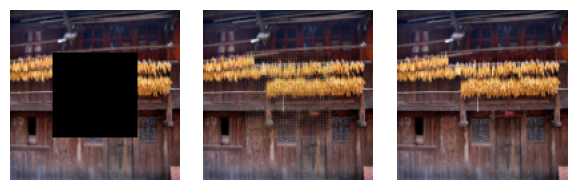

In [106]:
display_images([sample_sanity_batch_img[0], get_infilled_image(sample_sanity_batch_img[0], sanity_enc, sanity_dec), sample_sanity_batch_gt[0]], images_per_row=3)

### Train the sanity model

In [ ]:
# Do the training
sanity_train_loss_history = []
sanity_val_loss_history = []
do_training(
	epochs=50, 
	train_loss_history=sanity_train_loss_history, 
	val_loss_history=sanity_val_loss_history, 
	data_loader=sanity_loader, 
	optim=sanity_optim,
	encoder=sanity_enc, 
	decoder=sanity_dec,
	loss_fn=l2_loss
	)

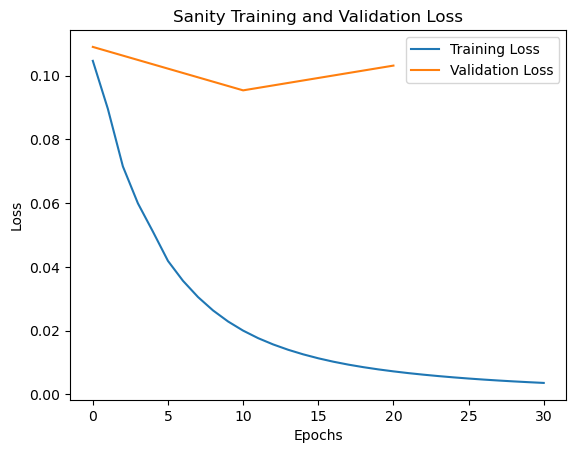

In [53]:
display_loss_history_graph(sanity_train_loss_history, sanity_val_loss_history, title="Sanity Training and Validation Loss")

### Sanity Model Results

We can see that the sanity model learns to perfect reconstruct the infill area as expected, by simply memorizing the image. Note that the left image is the input to the model, the middle is the model generated image, dn the right images is the ground truth image.

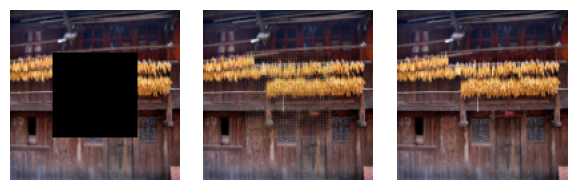

In [54]:
display_images([sample_sanity_batch_img[0], get_infilled_image(sample_sanity_batch_img[0], sanity_enc, sanity_dec), sample_sanity_batch_gt[0]], images_per_row=3)

### Trying to use the sanity model on other images

We can see that the sanity model has simply learned to memorize the sanity infill area and just outputs the same infill area when used with other images.

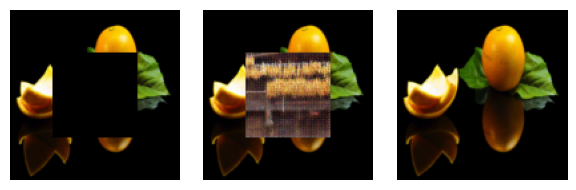

In [55]:
display_images([sample_val_batch_img[0], get_infilled_image(sample_val_batch_img[0], sanity_enc, sanity_dec), sample_val_batch_gt[0]], images_per_row=3)

## Training a full model using L2 Loss
We will now train a full model using the L2 loss.

In [73]:
l2_enc = Encoder().to(device)
l2_dec = Decoder().to(device)
l2_optim = get_optimizer(l2_enc, l2_dec)

### Untrained Model Results

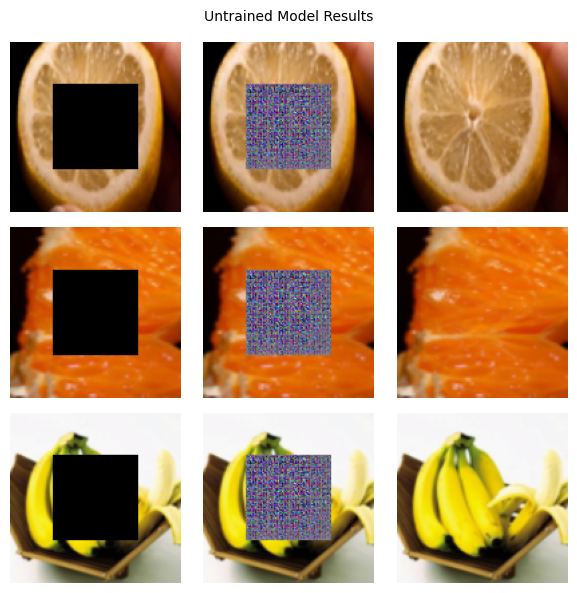

In [74]:
def show_model_results(enc, dec, img_batch, gt_batch, title, min=0, max=10):
	images = []
	for index in range(min, max):
		images += [img_batch[index], get_infilled_image(img_batch[index], enc, dec), gt_batch[index]]
	display_images(images, images_per_row=3, title=title)

show_model_results(l2_enc, l2_dec, sample_train_batch_img, sample_train_batch_gt, "Untrained Model Results", max=3)

In [ ]:
train_loss_history = []
val_loss_history = []

do_training(
	epochs=5000, 
	train_loss_history=train_loss_history, 
	val_loss_history=val_loss_history, 
	data_loader=train_loader, 
	optim=l2_optim,
	encoder=l2_enc, 
	decoder=l2_dec,
	should_save=True,
	loss_fn=l2_loss
)

![L2 Model Results](./L2/l2-model.png)

Note since the training was run overnight, we extracted the code in this notebook to a separate python script which we ran to train the network, and which saves the trained model to a file, along with the loss graph. Thus in this notebook we will load the results from the training runs and display them. Note that the training calls in this notebook do indeed work and our models can be retained by calling the above function.

In [98]:
# Load the model from the overnight training run
load_model(l2_enc, l2_dec, l2_optim, "./L2/l2-model-150-0.03.pth")

### L2 Model Results


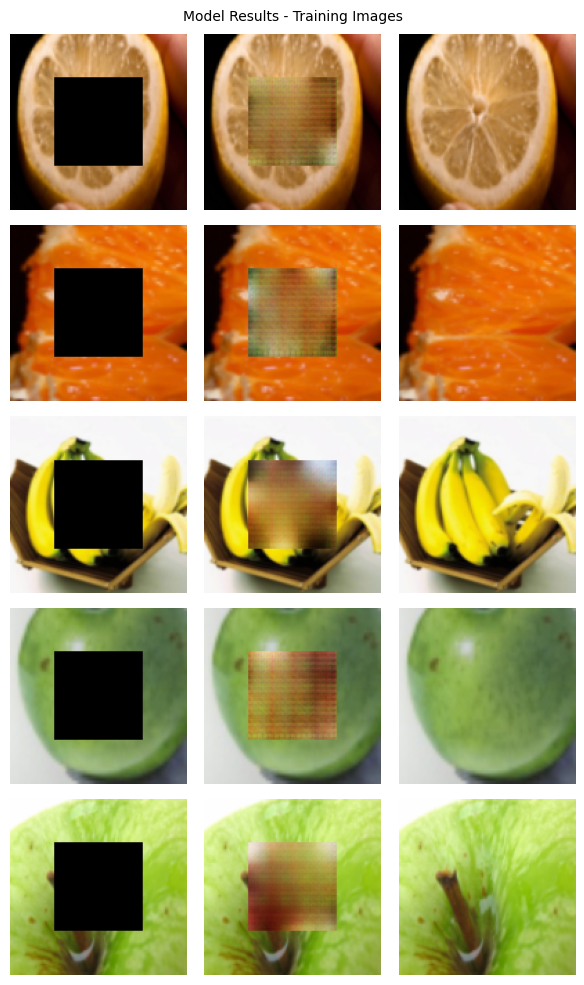

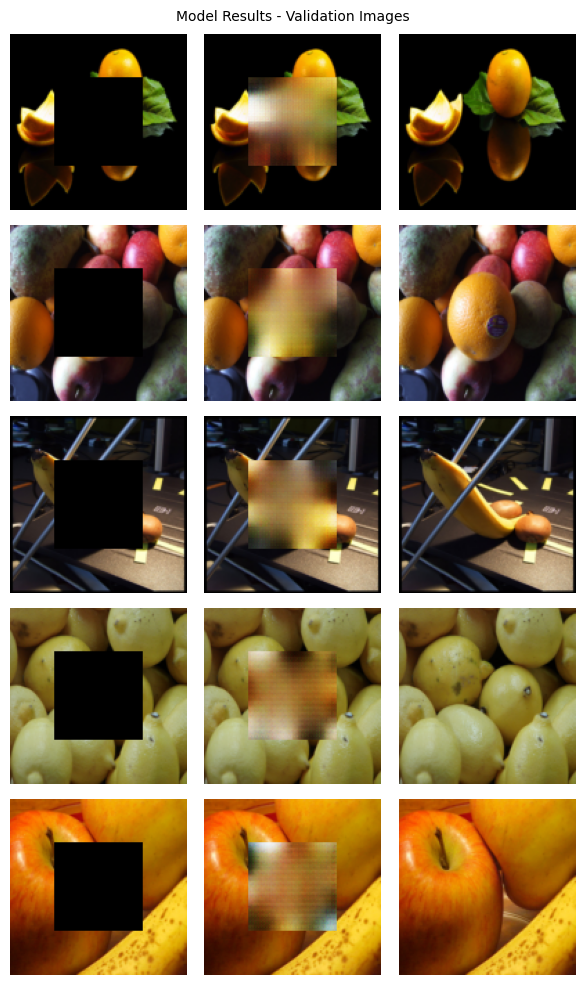

In [99]:
show_model_results(l2_enc, l2_dec, sample_train_batch_img, sample_train_batch_gt, "Model Results - Training Images", max=5)
show_model_results(l2_enc, l2_dec, sample_val_batch_img, sample_val_batch_gt, "Model Results - Validation Images", max=5)

### L2 Model Discussion

We see that the model performs somewhat correctly, infilling the area with an infilling that is somewhat the right color and shape, though the overall color tint of the model is off. Furthermore, the infilled area of the model is quite blurry. As discussed in the context encoder paper, the likely culprit is that the L2 loss encourages the model to generate a "safer" infill area that is on average close to the correct infilling area. Each context could be infilled in multiple different ways, and instead of the model fully committing to one, it picks an "average" infilling which does minimize the L2 loss, but does not look realistic.


The original context encoder paper solves this problem by introducing an additional "adversarial" loss, which is obtained by training a separate network alongside this network which learns to discriminate real images from fake ones. However, due to the known challenges in training these models, we chose to try a different approach.

We instead try to get rid of the blurriness problem by adding other terms to the loss function instead of the adversarial loss that somehow better quantifies how similar the infill area is to the real area.

## First Attempt at alternative loss function: SSIM

Structure Similarity Index Measure is a measure that compares the similarities of two images. Instead of just being the absolution color difference, it pays more attention to similarities between pixels which are close to each other, and is meant to be more similar to how a human would observe the difference between two images. 

We decided to try using this loss function since the problem in the last part was that by minimizing the L2 loss, the model didn't necessary create an infilling that looks good to humans. Since SSIM is meant to better capture what humans consider similar, we hoped that by minimizing SSIM, we would get a more realistic reconstruction.

In [82]:
ssim_loss = pytorch_ssim.SSIM()

In [ ]:
ssim_enc = Encoder().to(device)
ssim_dec = Decoder().to(device)
ssim_optim = get_optimizer(ssim_enc, ssim_dec)
train_loss_history = []
val_loss_history = []

do_training(
	epochs=5000, 
	train_loss_history=train_loss_history, 
	val_loss_history=val_loss_history, 
	data_loader=train_loader, 
	optim=ssim_optim,
	encoder=ssim_enc, 
	decoder=ssim_dec,
	should_save=True,
	loss_fn=ssim_loss
)

![SSIM Loss](only-SSIM/only-ssim-no-l1-run.png)

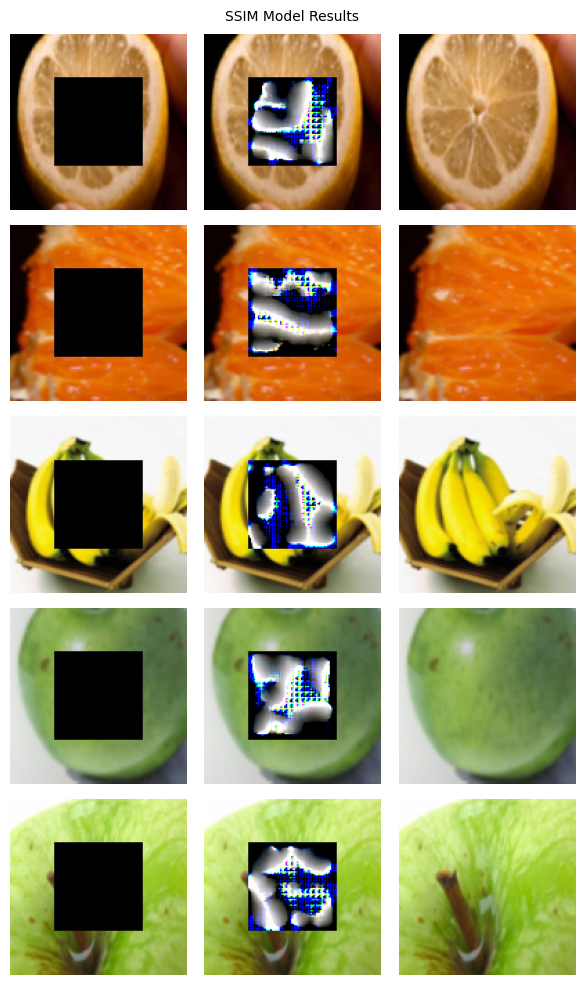

In [86]:

# Load the model from the overnight training run
load_model(l2_enc, l2_dec, l2_optim, "./only-SSIM/only-ssim-model-720--0.04.pth")
show_model_results(l2_enc, l2_dec, sample_train_batch_img, sample_train_batch_gt, "SSIM Model Results", max=5)

### Only SSIM discussion


We see that only using SSIM as our loss function does not lead to good results. One hypothesis as to why, is that SSIM is usually not meant to be applied on RGB images, but rather to the gray scale component of images, and thus does not provide useful gradients for the comparison in terms of color. This leads us to apply SSIM and the L2 loss function at the same time.

### SSIM + L2 loss

In [ ]:
SSIM_LOSS_RATIO = 0.1
def l2andssim_loss(output, target):
    return (1- SSIM_LOSS_RATIO)*l2_loss(output, target) + SSIM_LOSS_RATIO*ssim_loss(output, target)

In [ ]:
ssiml2_enc = Encoder().to(device)
ssiml2_dec = Decoder().to(device)
ssiml2_optim = get_optimizer(ssim_enc, ssim_dec)
train_loss_history = []
val_loss_history = []

do_training(
	epochs=5000, 
	train_loss_history=train_loss_history, 
	val_loss_history=val_loss_history, 
	data_loader=train_loader, 
	optim=ssiml2_optim,
	encoder=ssiml2_enc, 
	decoder=ssiml2_dec,
	should_save=True,
	loss_fn=l2andssim_loss
)

![L2 SSIM](./images/SSIML2.png)

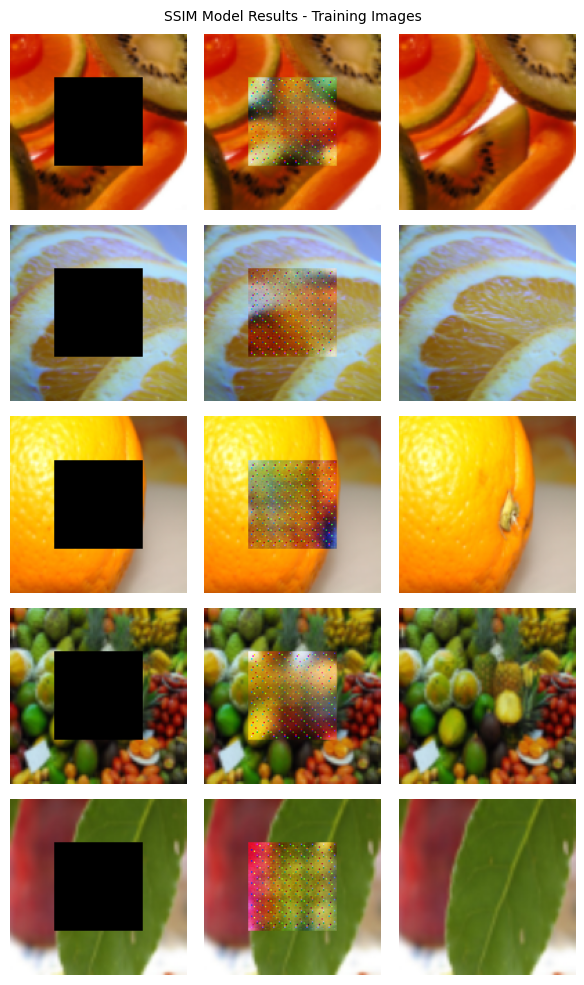

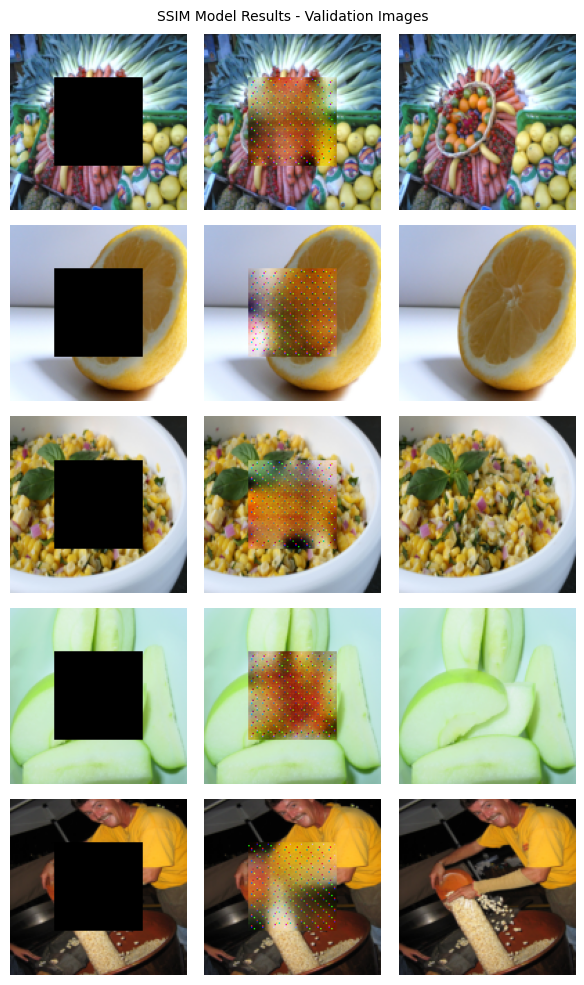

In [265]:
load_model(ssim_enc, ssim_dec, ssim_optim, "./trained_models/L2-SSIM/SSIML2.pth")
show_model_results(ssim_enc, ssim_dec, sample_train_batch_img, sample_train_batch_gt, "SSIM Model Results - Training Images", max=5)
show_model_results(ssim_enc, ssim_dec, sample_val_batch_img, sample_val_batch_gt, "SSIM Model Results - Validation Images", max=5)

We see that this model preforms well, creating a plausible reconstruction, which has less bluriness and better edges, which means that the SSIM loss does help. However, a bigger concern is that there are dot artifacts in the generated image. We think that these artifacts are the models way of trying to lower the SSIM loss, instead of changing the overall structure of the regeneration, the model simply adds these intense points which seem to lower the SSIM. We will add attempt to remove these artifacts:

### Removing Dot Artifacts:

To remove the dot artifacts, we will apply a median filter (since the dots have extreme values, they are unlikely to be the median in an image patch), which gets rid of most of the dots, followed by a mean filter, which gets rid of the few remaining dots. 

In [365]:
## Median Filter Adapted From: https://gist.github.com/rwightman/f2d3849281624be7c0f11c85c87c1598
class MedianPool2d(nn.Module):
    """ Median pool (usable as median filter when stride=1) module.
    
    Args:
         kernel_size: size of pooling kernel, int or 2-tuple
         stride: pool stride, int or 2-tuple
         padding: pool padding, int or 4-tuple (l, r, t, b) as in pytorch F.pad
         same: override padding and enforce same padding, boolean
    """
    def __init__(self, kernel_size=3, stride=1, padding=0, same=False):
        super(MedianPool2d, self).__init__()
        self.k = _pair(kernel_size)
        self.stride = _pair(stride)
        self.padding = _quadruple(padding)  # convert to l, r, t, b
        self.same = same

    def _padding(self, x):
        if self.same:
            ih, iw = x.size()[2:]
            if ih % self.stride[0] == 0:
                ph = max(self.k[0] - self.stride[0], 0)
            else:
                ph = max(self.k[0] - (ih % self.stride[0]), 0)
            if iw % self.stride[1] == 0:
                pw = max(self.k[1] - self.stride[1], 0)
            else:
                pw = max(self.k[1] - (iw % self.stride[1]), 0)
            pl = pw // 2
            pr = pw - pl
            pt = ph // 2
            pb = ph - pt
            padding = (pl, pr, pt, pb)
        else:
            padding = self.padding
        return padding
    
    def forward(self, x):
        _, original_size_x, original_size_y = x.shape
        x = F.pad(x, self._padding(x), mode='reflect')
        x = x.unfold(2, self.k[0], self.stride[0]).unfold(3, self.k[1], self.stride[1])
        x = x.contiguous().view(x.size()[:4] + (-1,)).median(dim=-1)[0].squeeze(3)
        return x

In [367]:
def remove_dot_artifacts(img):
	_, original_size_x, original_size_y = img.shape
	output = MedianPool2d(stride=1, padding=2, kernel_size=5)(img)
	mean_kernel_size = 3 
	mean_filter_kernel = torch.ones((3, 1, mean_kernel_size, mean_kernel_size)) / (mean_kernel_size ** 2)
	output = F.conv2d(output, mean_filter_kernel, padding=0, groups=3)
	return torchvision.transforms.Resize((original_size_x, original_size_y))(output)

def get_infilled_image_removing_dots(img, encoder, decoder):
		fill_area = remove_dot_artifacts(predict_fill_area_for_img(img, encoder, decoder))
		with_center = AddImageCenter(IMAGE_SIZE, CENTER_SIZE)(torch.clone(img), fill_area)
		return with_center

def show_model_results_removing_dots(enc, dec, img_batch, gt_batch, title, min=0, max=10):
	images = []
	for index in range(min, max):
		images += [img_batch[index], get_infilled_image_removing_dots(img_batch[index], enc, dec), gt_batch[index]]
	display_images(images, images_per_row=3, title=title)


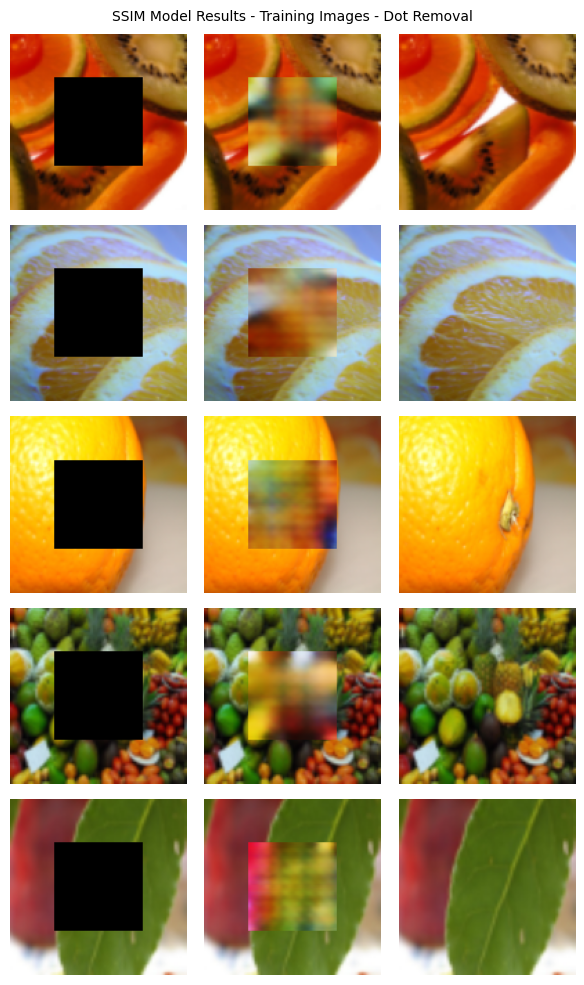

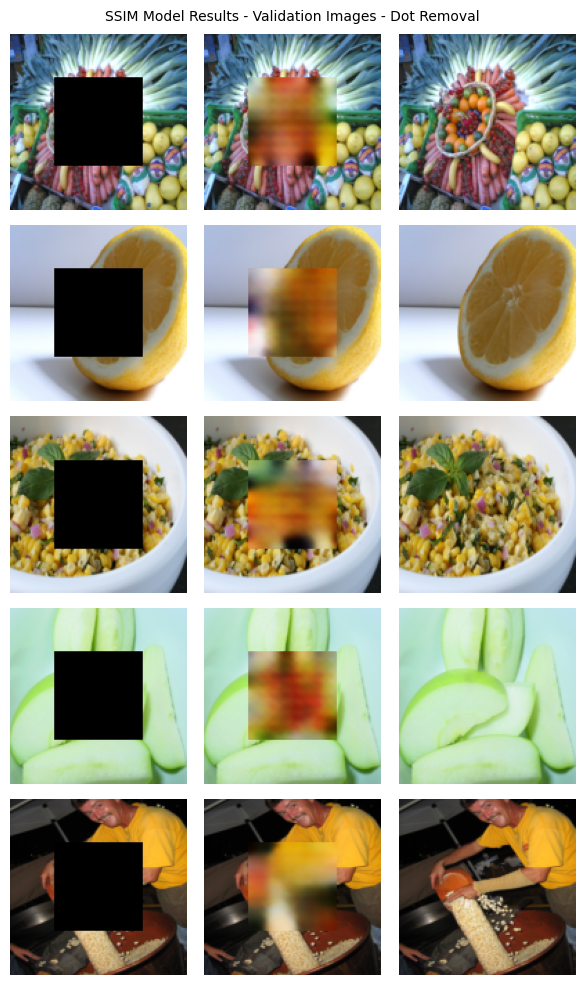

In [368]:
show_model_results_removing_dots(ssim_enc, ssim_dec, sample_train_batch_img, sample_train_batch_gt, "SSIM Model Results - Training Images - Dot Removal", max=5)
show_model_results_removing_dots(ssim_enc, ssim_dec, sample_val_batch_img, sample_val_batch_gt, "SSIM Model Results - Validation Images - Dot Removal", max=5)

## Approach 2: Instead of SSIM, adding a "sharpness" loss based on image edges from images gradients

Our next attempt will arise from the following motivation: If an image is blurry, the gradient of the image will not be similar to the ground truth image, which we know because blurry images do not have nicely defined edges. We will use this to our advantage by penalizing the model by comparing the ground truth gradients with the the generated gradients. 

We will use the Sobel filter (https://en.wikipedia.org/wiki/Sobel_operator), which is a classic filter which detects edges in images by approximating the gradient of the image.

In [370]:
class SobelFilter(nn.Module):
    def __init__(self):
        super(SobelFilter, self).__init__()
        self.sobel_filter_x = nn.Conv2d(3, 3, kernel_size=3, stride=1, padding=1, bias=False)
        self.sobel_filter_y = nn.Conv2d(3, 3, kernel_size=3, stride=1, padding=1, bias=False)
        sobel_kernel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32).view(1, 1, 3, 3).broadcast_to((1, 3, 3, 3))
        sobel_kernel_y = torch.tensor([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=torch.float32).view(1, 1, 3, 3).broadcast_to((1, 3, 3, 3))
        self.sobel_filter_x.weight = nn.Parameter(sobel_kernel_x)
        self.sobel_filter_y.weight = nn.Parameter(sobel_kernel_y)

    def forward(self, image):
        grad_output_x = self.sobel_filter_x(image)
        grad_output_y = self.sobel_filter_y(image)
        return grad_output_x, grad_output_y
sobel_filter = SobelFilter()
sobel_filter = sobel_filter.to(device)

#### Visualization of Sobel Filter

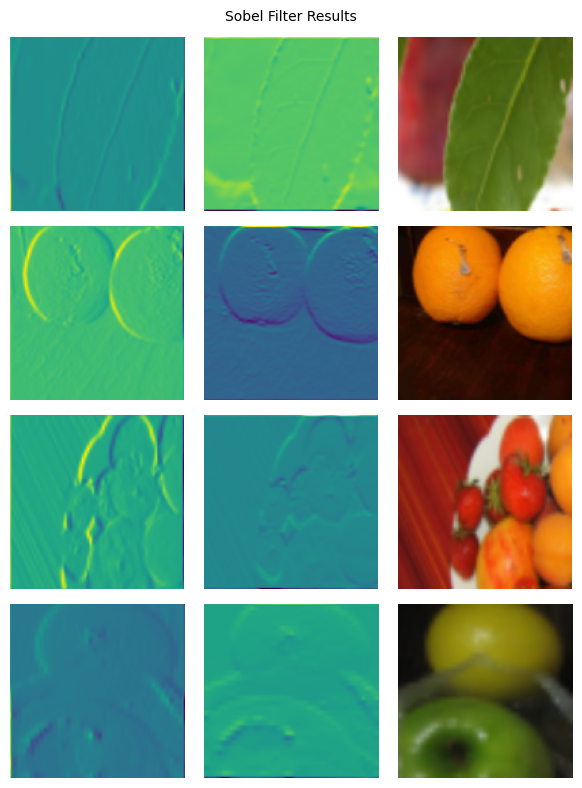

In [319]:
images = []

sobel_filter_sample = sobel_filter(sample_train_batch_gt.to(device))

for i in range(4, 8):
	images += [
								sobel_filter_sample[0].cpu()[i],
								sobel_filter_sample[1].cpu()[i],
								sample_train_batch_gt[i]
								] 
display_images(images, images_per_row=3, title="Sobel Filter Results")

In [274]:
# Compute a loss based on the difference in edges of the images
def sharpness_loss(img1, img2):
	grad_x_img_1, grad_y_img_1 = sobel_filter(img1)
	grad_x_img_2, grad_y_img_2 = sobel_filter(img2)

	grad_diff_x = torch.abs(grad_x_img_1 - grad_x_img_2)
	grad_diff_y = torch.abs(grad_y_img_1 - grad_y_img_2)

	loss = torch.mean(grad_diff_x + grad_diff_y)
	return loss

def l2_and_sharpness_loss(output, target):
    L2_LAMBDA = 10
    SHARPNESS_LAMBDA = 1

    l2_loss_value = l2_loss(output, target)
    edge_diff_loss_value = sharpness_loss(output, target)

    return L2_LAMBDA*l2_loss_value+ SHARPNESS_LAMBDA*edge_diff_loss_value

In [ ]:
sharpness_enc = Encoder().to(device)
sharpness_dec = Decoder().to(device)
sharpness_optim = get_optimizer(sharpness_enc, sharpness_dec)
train_loss_history = []
val_loss_history = []

do_training(
	epochs=5000, 
	train_loss_history=train_loss_history, 
	val_loss_history=val_loss_history, 
	data_loader=train_loader, 
	optim=sharpness_optim,
	encoder=sharpness_enc, 
	decoder=sharpness_dec,
	should_save=True,
	loss_fn=l2_and_sharpness_loss
)

![Only Sharpness](./images/l2-sharpness-run.png)

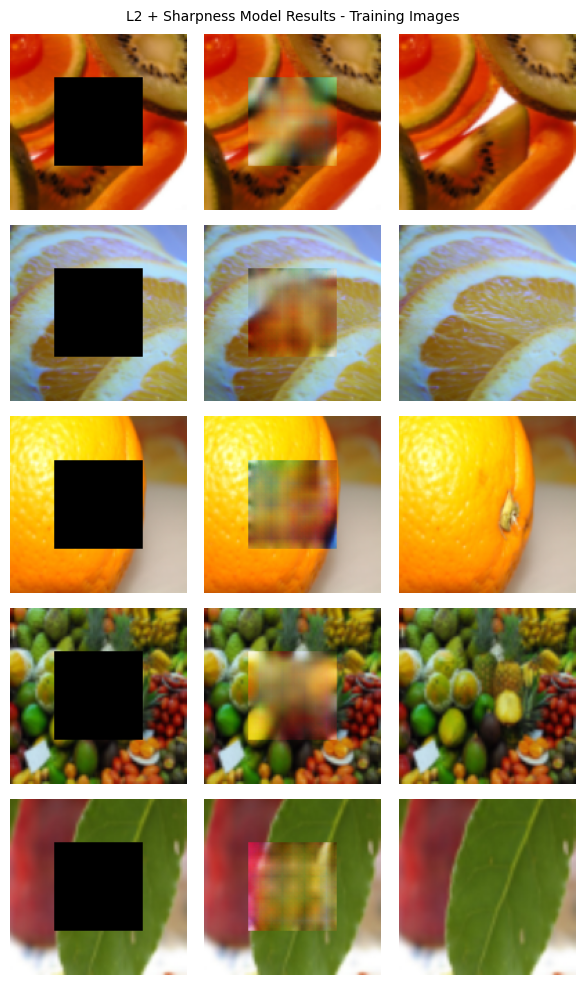

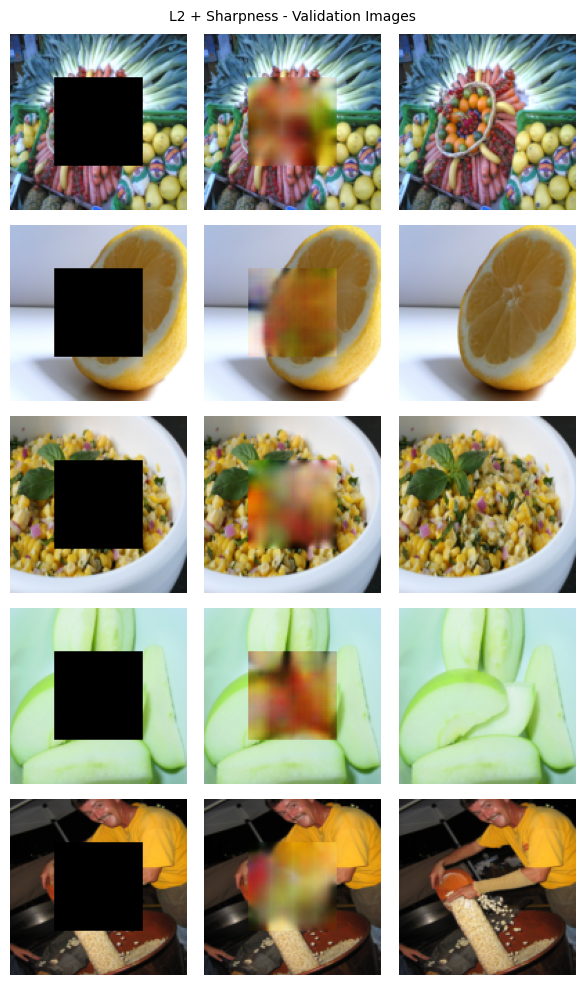

In [287]:
# Load training results
load_model(sharpness_enc, sharpness_dec, sharpness_optim, "./trained_models/L2-Sharpness/l2-sharpness-model-3360-0.90.pth")
show_model_results(sharpness_enc, sharpness_dec, sample_train_batch_img, sample_train_batch_gt, "L2 + Sharpness Model Results - Training Images", max=5)
show_model_results(sharpness_enc, sharpness_dec, sample_val_batch_img, sample_val_batch_gt, "L2 + Sharpness - Validation Images", max=5)

We see that this model also performs better than the only L2 model, however, it's not as good as the SSIM model.

## Final Approach: SSIM + Sharpness Loss + L2 loss

Since both the SSIM loss helped improve the clarity of the images, and the sharpness loss also helped improve the clarity (all though less than the SSIM), we train our final model with a loss that includes both.

In [ ]:
def ssim_l2_sharpness_loss(output, target):
    L2_LAMBDA = 10
    SHARPNESS_LAMBDA = 1
    SSIM_LAMBDA = 2

    l2_loss_value = l2_loss(output, target)
    edge_diff_loss_value = sharpness_loss(output, target)
    ssim_loss_value = ssim_loss(output, target)

    return L2_LAMBDA*l2_loss_value+ SHARPNESS_LAMBDA*edge_diff_loss_value+ SSIM_LAMBDA*ssim_loss_value

final_enc = Encoder()
final_dec = Decoder()

final_optim = get_optimizer(final_enc, final_dec)

train_loss_history = []
val_loss_history = []
do_training(
  epochs=10000, 
  train_loss_history=train_loss_history, 
  val_loss_history=val_loss_history, 
  data_loader=train_loader, 
  optim=final_optim,
  encoder=final_enc, 
  decoder=final_dec,
  should_save=True,
  loss_fn=ssim_l2_sharpness_loss
)

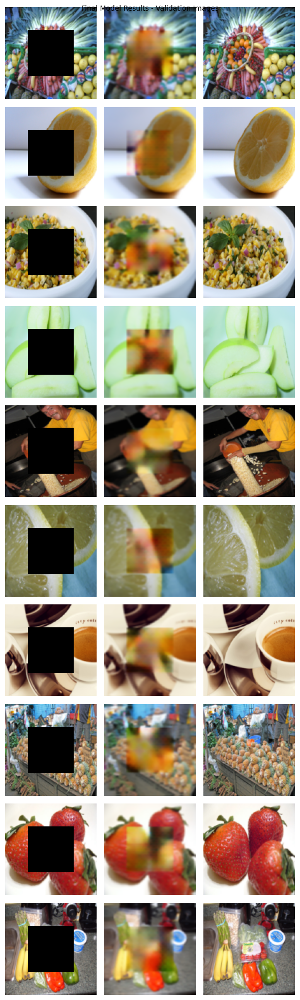

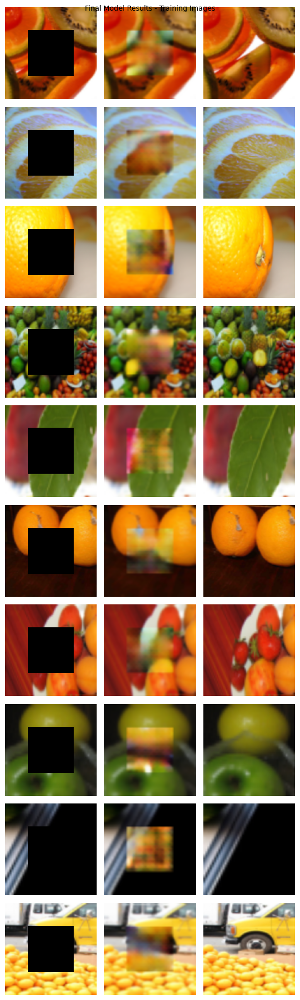

In [320]:
load_model(final_enc, final_dec, final_optim, "./trained_models/final-model/final-2990-1.86.pth")
show_model_results_removing_dots(final_enc, final_dec, sample_val_batch_img, sample_val_batch_gt, "Final Model Results - Validation Images", max=10)
show_model_results_removing_dots(final_enc, final_dec, sample_train_batch_img, sample_train_batch_gt, "Final Model Results - Training Images", max=10)


### Improving Blurryness with Unsharp Masking
We will attempt to use the unsharp masking technique to improve the blurriness of the generated images.

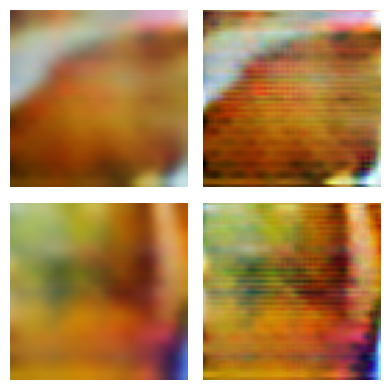

In [387]:
def unsharp_mask(img):
	blurred = torchvision.transforms.GaussianBlur(3, sigma=(7, 7))(img)
	unsharp = img - 1.0*blurred
	sharp = img + 10*unsharp
	sharp = torch.clip(sharp, 0, 1)
	return sharp


def get_infilled_image_unsharp_mask(img, encoder, decoder):
		fill_area = remove_dot_artifacts(predict_fill_area_for_img(img, encoder, decoder))
		sharp_fill_area = unsharp_mask(fill_area)

		sharp_with_center = AddImageCenter(IMAGE_SIZE, CENTER_SIZE)(torch.clone(img), sharp_fill_area)
		with_center = AddImageCenter(IMAGE_SIZE, CENTER_SIZE)(torch.clone(img), fill_area)

		blurred = torchvision.transforms.GaussianBlur(5, sigma=(5, 5))(sharp_with_center)
		return with_center, sharp_with_center, blurred


def visualize_unsharp_mask(encoder, decoder):
	images = []
	for i in range(1, 3):
		fill_area = remove_dot_artifacts(predict_fill_area_for_img(sample_train_batch_img[i], encoder, decoder))
		unsharped = unsharp_mask(fill_area)
		images += [fill_area, unsharped]
	display_images(images)
visualize_unsharp_mask(final_enc, final_dec)

We see that the unsharp does make the image more clear to some degree, but does introduce some artifacts. We will use this more sharp (but blurred artifact), to help us better blend the generated patches back to the image. Our idea is to infill using the unsharp masked generated image, and then blur the entire image, which will get rid of the artifacts reduced by unsharp masking. The benefit of unsharp masking is we won't further blur the blurred infilled area, instead we are first sharpening the infill area, and then blurring everything tegether.

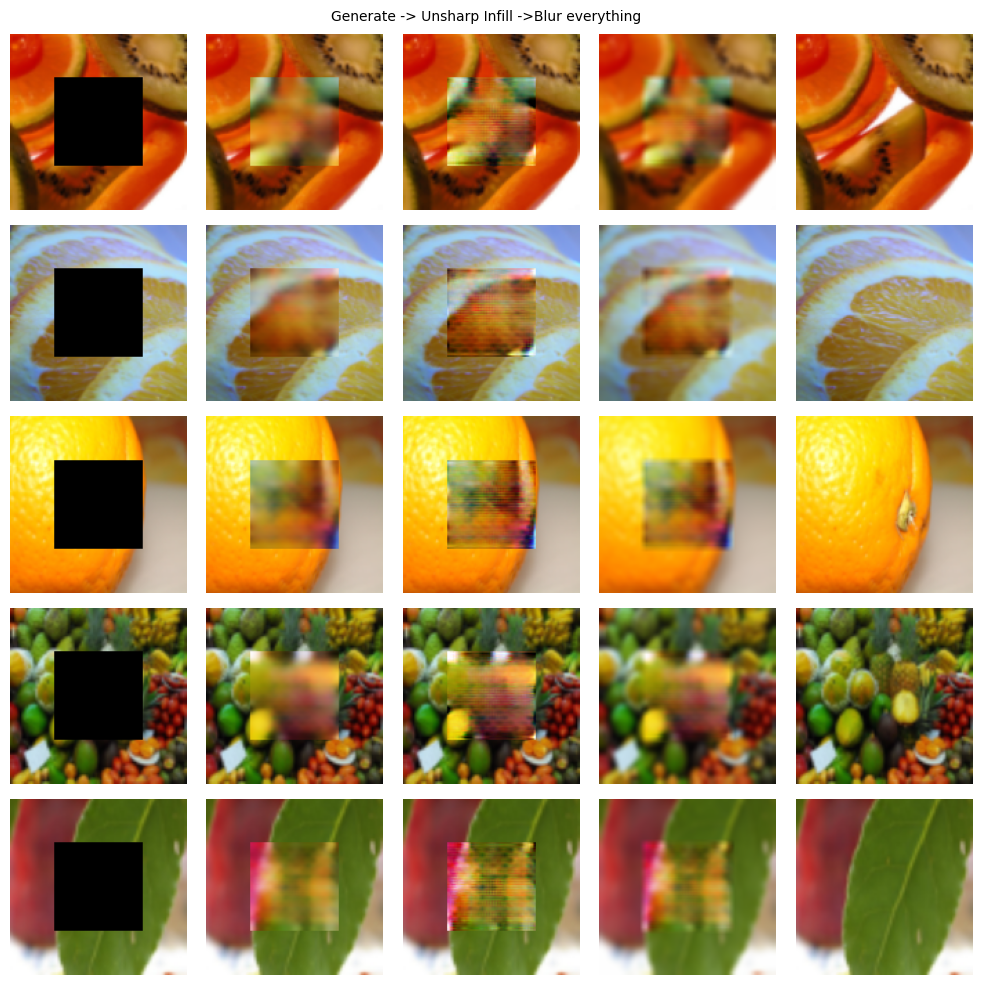

In [388]:
def show_unsharp_progression(enc, dec, batch, gt_batch, min=0, max=10):
	images = []
	for index in range(min, max):
		img, img_gt,  = batch[index], gt_batch[index]
		sharp, unsharp, blurred = get_infilled_image_unsharp_mask(img, enc, dec)
		images += [img, sharp, unsharp, blurred, img_gt]

	display_images(images, images_per_row=5, title="Generate -> Unsharp Infill ->Blur everything  ")

show_unsharp_progression(final_enc, final_dec, sample_train_batch_img, sample_train_batch_gt, max=5)

# Final Results on the validation set
Here you can see some final generations from our full workflow.

To summarize the full workflow:
- Given an image with a hole cutout
- We use our autoencoder (trained using L2, Sharpness, and SSIM loss) to generate a fill area
- We remove the dot artifacts from the generated area using a mean and median filter
- We use an unsharp mask to make the generated area more sharp
- We paste the infilled are into the hole of the original image
- We blur the final image to make make the edges of the fill area more smooth and get rid of artifacts introduced by unsharp masking

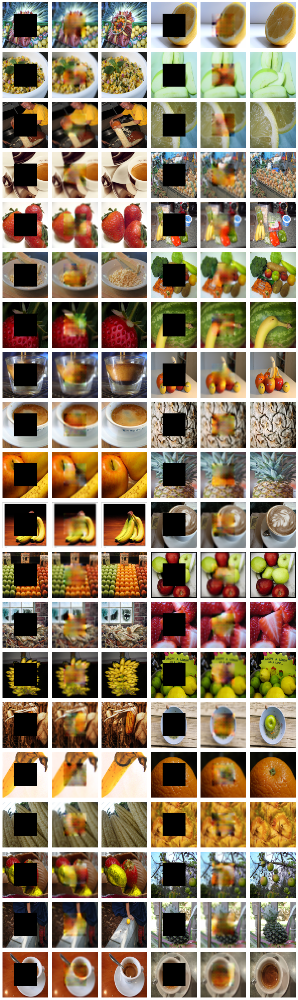

In [389]:
def show_final_results(enc, dec, batch, gt_batch, min=0, max=10):
	images = []
	for index in range(min, max):
		img, img_gt,  = batch[index], gt_batch[index]
		_, _, blurred = get_infilled_image_unsharp_mask(img, enc, dec)
		images += [img, blurred, img_gt]

	display_images(images, images_per_row=6)
show_final_results(final_enc, final_dec, sample_val_batch_img, sample_val_batch_gt, max=40)


## Visualizing the Latent Space

Initially, instead of training our own encoder, we tried to use the encoder from ResNet. However, this did not lead to good results. Thus we were interested in seeing the differences from our encoder to resnet. Our hypothesis is that the ResNet encoder focused more the the classification of the image, while our encoder focuses more on the color of the images. This is confirmed through the following, where we use principled component analysis to visualize the latent space of our encoder and the resent encoder. 

We provide two graphs, one where the points are plotted with their colors representing the categories, and another where the color of the point represents the average color of that image. 

Since our encoder cares more about the image color since it needs to be able to infill an area of the image, we expect our encoder to have a more structured pattern when viewer with the average color graph, while we expect the ResNet encoder to have a more structured pattern with the category encoder.

#### Visualizing the latent space from our Encoder 


In [390]:
def get_pca(data):
	data = data.numpy()
	pca = PCA(n_components=2)
	data_2d = pca.fit_transform(data)
	return data_2d

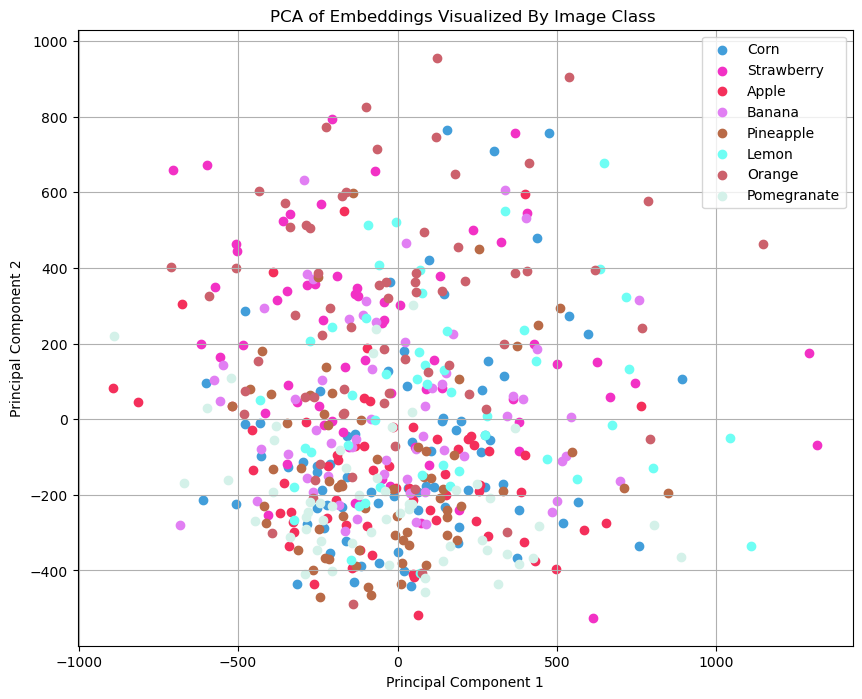

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


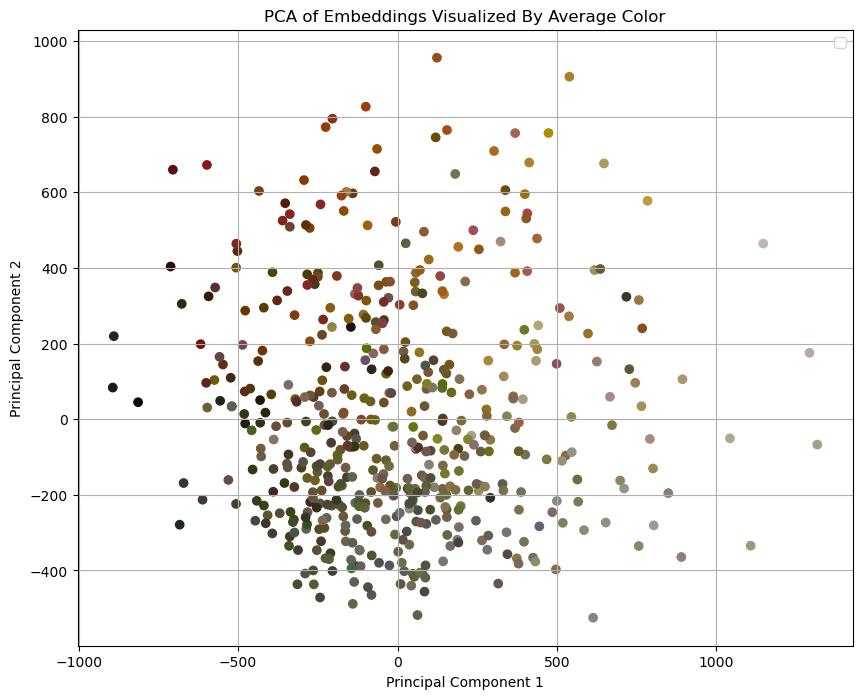

In [393]:
def visulize_encoder_embeddings(images, classes, encoder, by_class = False):
	with torch.no_grad():
		img_batch = images.to(device)
		embedded = encoder(img_batch).detach().cpu()
		resnet_pca = get_pca(embedded)

		plt.figure(figsize=(10, 8))
		if by_class:
			for idx, name in SELECTED_CLASSES.items():
				r, g, b = torch.rand(3)
				plt.scatter(resnet_pca[classes == idx, 0], resnet_pca[classes == idx, 1], color=[(r, g, b)], label=name)

		else:
			avg_color = torch.mean(images, axis=[2,3])
			avg_color = avg_color.tolist()
			plt.scatter(resnet_pca[:, 0], resnet_pca[:, 1], color=avg_color)

		by_txt = "Image Class " if by_class else "Average Color"
		plt.legend()
		plt.title("PCA of Embeddings Visualized By "+ by_txt  )
		plt.xlabel("Principal Component 1")
		plt.ylabel("Principal Component 2")
		plt.grid(True)
		plt.show()


visulize_encoder_embeddings(sample_train_batch_img, sample_train_batch_classes, final_enc, by_class=True)
visulize_encoder_embeddings(sample_train_batch_img, sample_train_batch_classes, final_enc)

As expected, we see that our model's encoder does not have a clear pattern when visualized by classification (it does not seem to cluster images of the same class together), but does seem to cluster images of the same average color together, the darker images are in the bottom left and lighter and more red images near the top.

### Visualizing the latent space from ResNet

In [394]:
class ResNetEncoder(nn.Module):
    def __init__(self):
        super(ResNetEncoder, self).__init__()
        self.resnet = models.resnet50(weights='ResNet50_Weights.DEFAULT')

    def forward(self, inp):
        inp = self.resnet.conv1(inp)
        inp = self.resnet.bn1(inp)
        inp = self.resnet.relu(inp)
        inp = self.resnet.maxpool(inp)
        inp = self.resnet.layer1(inp)
        inp = self.resnet.layer2(inp)
        inp = self.resnet.layer3(inp)
        inp = self.resnet.layer4(inp)
        inp = self.resnet.avgpool(inp)
        inp = inp.reshape((-1, 2048))
        return inp

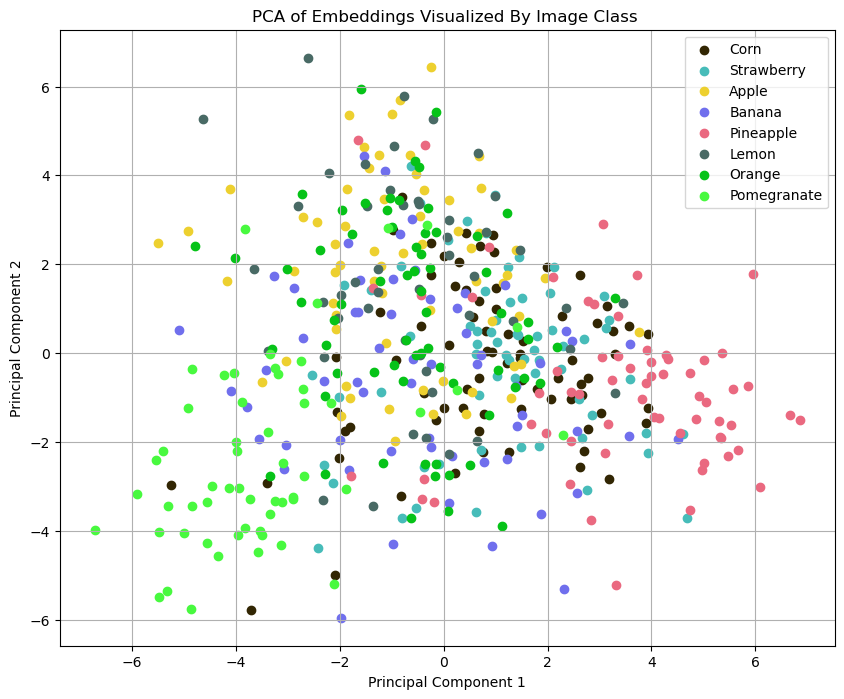

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


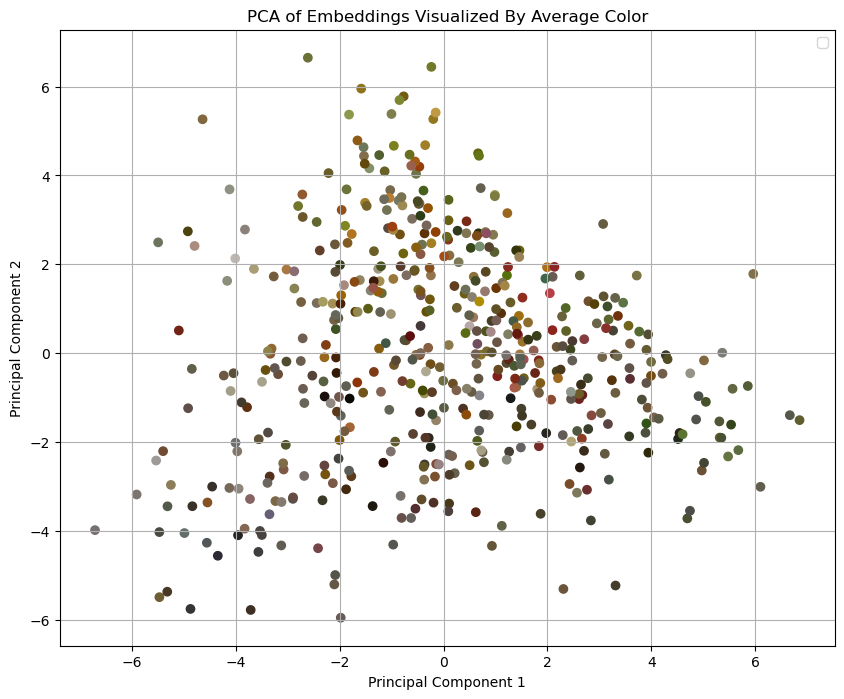

In [395]:
res_net_encoder = ResNetEncoder()
res_net_encoder = res_net_encoder.to(device)
visulize_encoder_embeddings(sample_train_batch_img, sample_train_batch_classes, res_net_encoder, by_class=True)
visulize_encoder_embeddings(sample_train_batch_img, sample_train_batch_classes, res_net_encoder)

As expected we see that in the ResNet model has a very clear pattern when viewer through different image classes (a clear triangle pattern of colors, clustering images of the same class). But it does not express much of a pattern when viewed through average color, which makes sense, since the ResNet encoder was not trained to care about the color of images, but rather to classify what is in them. This explains why for our model, we needed to train a new encoder that pays attention to the color of images.


# Conclusion

In conclusion, we created a novel image inpainting workflow, that involves an ML autoencoder, and some classical CV processing. We took inspiration from the Context Encoders paper by Pathak et al. and created an autoencoder that encoders a cutout image in a high dimensional latent space, and then a decoder that decodes that into an infilled area. When training this model with only L2 loss, we noticed blurry results (same as Pathak et al.), however, instead of taking the same approach that they took (using a discriminator loss), we experimented with using different losses functions to improve the blurriness.

Our first approach involved adding an SSIM based loss term when training the model. SSIM was able to help improve the blurriness, however it introduced dot artifacts to the infilled image. To solve these artifacts, we used median and mode filters. Our second approach involved using image gradients to create a sharpness loss term based on the edges in the ground truth infilling and the generated infilling. This approach also worked, though not as well as the SSIM approach. Our final model includes both of these loss terms in the results of the model. Then, we investigated using unsharp masking to further improve the blurriness of the infilled area. While unsharp masking did help the blurriness, it introduced new artifacts. Thus, we perform a final blur over the entire infilled image, which serves to make the bounds of the infilled area less noticeable and remove the artifacts from the unsharp masking. 

Finally, we visualized the latent space of our encoder using PCA, and noticed that it grouped images with similar average color together, while it did not always group same category images together. In contrast, we noticed that the ResNet encoder does not group similar color images together, but does group same class categories together.